# Segmentation d'IRM du coeur: rendu final
*par **Quentin Révillon, Benjamin Dupuis***

En se basant sur des techniques d'analyse d'image traditionnelle, et par opposition aux approches plus récente de Deep-Learning (type CNN), l'objectif de notre projet est de fournir une méthode de segmentation du ventricule gauche du coeur sur des images IRM. Cette méthode doit être robuste, précise et rapide.

## Plannification:
Pour mener à bien ce projet et sur les conseils de notre encadrant, nous avons décidé de nous concentrer sur un algorithme de segmentation par croissance de région.
Essentiellement, cela consiste à suivre les étapes suivantes:
1. **Choix de graine** (*seed finding*): choisir un pixel de départ le plus proche possible du centre du ventricule gauche.
2. **Segmentation par croissance de région**: (*region growing*) à partir de la graine, on va agrandir la région selon un critère.

## Jeu de données:
Notre jeu de données provient du [*Automatic Cardiac Diagnosis Challenge*](Automated Cardiac Diagnosis Challenge) organisé en 2017. Il est composé des images 4D (3d + temps) de 150 patients (100 pour l'entraînement et 50 pour le test). Pour chaque patient, des segmentations manuelles du ventricule gauche pour le moment de la pression maximale (systole) et de la pression minimale (diastole) sont fournies.

## Evaluation:
Pour évaluer **nos algorithmes de seed growing**, nous utiliserons une métrique simple qui mesure le pourcentage de graine placés dans le ventricule gauche. \

Pour évaluer **notre segmentation finale**, nous utiliserons principalement l'indice de Dice, qui mesure la similarité entre deux ensembles. \
Il est défini comme: $$D = \frac{2|A \cap B|}{|A| + |B|}$$ où $A$ est la segmentation de référence et $B$ notre segmentation.

Pour référence, voici les résultats obtenus lors d'une challenge original (principalement basé sur des approches de Deep-Learning), avec ED pour *End-Diastole* et ES pour *End-Systole*:

| Rang | Utilisateur              | DICE Moyen ED | DICE Moyen ES |
|------|--------------------------|---------------|---------------|
| 1    | Georgios Simantiris      | 0.967         | 0.928         |
| 1    | Fabian Isensee           | 0.967         | 0.928         |
| 2    | Clement Zotti            | 0.964         | 0.912         |
| 3    | Nathan Painchaud         | 0.961         | 0.911         |
| 4    | Mahendra Khened          | 0.964         | 0.917         |
| 5    | Christian Baumgartner    | 0.963         | 0.911         |
| 6    | Jelmer Wolterink         | 0.961         | 0.918         |
| 7    | Marc-Michel Rohé         | 0.957         | 0.900         |
| 8    | Clement Zotti            | 0.957         | 0.905         |
| 9    | Shubham Jain             | 0.955         | 0.885         |
| 10   | Ilias Grinias            | 0.948         | 0.848         |
| 11   | Xin Yang                 | 0.864         | 0.775         |


## Organisation du notebook:
Ce notebook est structuré en plusieurs parties interconnectées et non conçues pour une exécution indépendante.

[1. Visualisation et analyse des données](#1-Visualisation-et-analyse-des-données) \
[2. Seed finding](#2-Seed-finding) \
[3. Region growing](#3-Region-growing) \
[4. Algorithme final](#4-Algorithme-final) \
[5. Evaluation](#5-Evaluation) \
[6. Conclusion](#6-Conclusion)


---

# 0. Importation des librairies

In [1]:
# Loading and general processing of the data

import os
import numpy as np
import nibabel as nib
import pandas as pd

# Visualization specific
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.io as pio

# Image processing
import cv2
from skimage.segmentation import flood
from skimage.morphology import convex_hull_image
from skimage.measure import perimeter

# Diverse
from tqdm import tqdm


---

## 1. Visualisation et analyse des données
Tout bon travail avec un jeu de données commence par une visualisation et une analyse de ces données. Cela permet de mieux les comprendre et de mieux les exploiter.

In [2]:
"""On compte le nombre de patients"""

training_base_path = 'database/training/'
testing_base_path = 'database/testing/'

training_folders = [folder for folder in os.listdir(training_base_path) if os.path.isdir(os.path.join(training_base_path, folder))]
print(f"Found {len(training_folders)} patients in the training dataset.")

testing_folders = [folder for folder in os.listdir(testing_base_path) if os.path.isdir(os.path.join(testing_base_path, folder))]
print(f"Found {len(testing_folders)} patients in the testing dataset.")

Found 100 patients in the training dataset.
Found 50 patients in the testing dataset.


### Analyse de la distribution des images

In [38]:
image_shapes = []

for folder in training_folders:
    image_path = os.path.join(training_base_path, folder, f'{folder}_4d.nii.gz')
    
    image = nib.load(image_path)
    data = image.get_fdata()
    
    image_shapes.append(data.shape)

for folder in testing_folders:
    image_path = os.path.join(testing_base_path, folder, f'{folder}_4d.nii.gz')
    
    image = nib.load(image_path)
    data = image.get_fdata()
    
    image_shapes.append(data.shape)

image_shapes = np.array(image_shapes)

# Display the range of shapes
print("Image Shape Statistics:")
print(f"- Width: min = {image_shapes[:, 0].min()}, max = {image_shapes[:, 0].max()}, mean = {image_shapes[:, 0].mean()}")
print(f"- Height: min = {image_shapes[:, 1].min()}, max = {image_shapes[:, 1].max()}, mean = {image_shapes[:, 1].mean()}")
print(f"- Number of Slices: min = {image_shapes[:, 2].min()}, max = {image_shapes[:, 2].max()}, mean = {image_shapes[:, 2].mean()}")
print(f"- Time Frames: min = {image_shapes[:, 3].min()}, max = {image_shapes[:, 3].max()}, mean = {image_shapes[:, 3].mean()}")

Image Shape Statistics:
- Width: min = 154, max = 428, mean = 219.72
- Height: min = 154, max = 512, mean = 243.14666666666668
- Number of Slices: min = 6, max = 21, mean = 9.926666666666666
- Time Frames: min = 12, max = 35, mean = 26.48


In [3]:
# Nécéssite l'éxecution de la cellule précédente

fig = go.Figure(data=[
    go.Scatter3d(
        x=image_shapes[:, 0],
        y=image_shapes[:, 1],
        z=image_shapes[:, 2],
        mode='markers',
        marker=dict(size=5)
    )
])

fig.update_layout(
    title='Distribution of Image Shapes in Training Dataset',
    scene=dict(
        xaxis_title='Width',
        yaxis_title='Height',
        zaxis_title='Number of Slices'
    )
)

fig.show()

NameError: name 'image_shapes' is not defined

### Chargement des images

In [4]:
def load_patient_images(patient_id=1):
    """
    Load MRI images and segmentations for a given patient.

    Returns:
        dict: A dictionary containing the following keys:
            - 'image_4d': The 4D MRI image data.
            - 'diastole': The diastole phase image data.
            - 'diastole_segmentation': The ground truth segmentation for diastole.
            - 'systole': The systole phase image data.
            - 'systole_segmentation': The ground truth segmentation for systole.
    """
    patient_id = int(patient_id)
    if patient_id >= 101:
        path = "database/testing"
    else:
        path = "database/training"

    patient_path = os.path.join(path, f"patient{patient_id:03d}")
    image_files = sorted(os.listdir(patient_path))[2:]

    image_4d = nib.load(os.path.join(patient_path, image_files[0]))
    diastole = nib.load(os.path.join(patient_path, image_files[1]))
    diastole_segmentation = nib.load(os.path.join(patient_path, image_files[2]))
    systole = nib.load(os.path.join(patient_path, image_files[3]))
    systole_segmentation = nib.load(os.path.join(patient_path, image_files[4]))

    return {
        "image_4d": image_4d.get_fdata(),
        "diastole": diastole.get_fdata(),
        "diastole_segmentation": diastole_segmentation.get_fdata(),
        "systole": systole.get_fdata(),
        "systole_segmentation": systole_segmentation.get_fdata()
    }


def load_frame(patient_id=1, zcoord="mid", image_type="diastole"):
    """
    Load a specific frame (slice) from a patient's MRI image.

    Parameters:
        zcoord (str or int): The z-coordinate of the slice to load.
            If 'mid', loads the middle slice.
        image_type (str): The type of image to load ('diastole' or 'systole').
    """
    patient_id = int(patient_id)
    image = load_patient_images(patient_id)[image_type]
    if zcoord == "mid":
        z = image.shape[2] // 2
        frame = image[:, :, z]
    else:
        try:
            z = int(zcoord)
            frame = image[:, :, z]
        except:
            print("zcoord should be an integer or 'mid'")
            return None
    return frame

print("Functions loaded successfully.")

Functions loaded successfully.


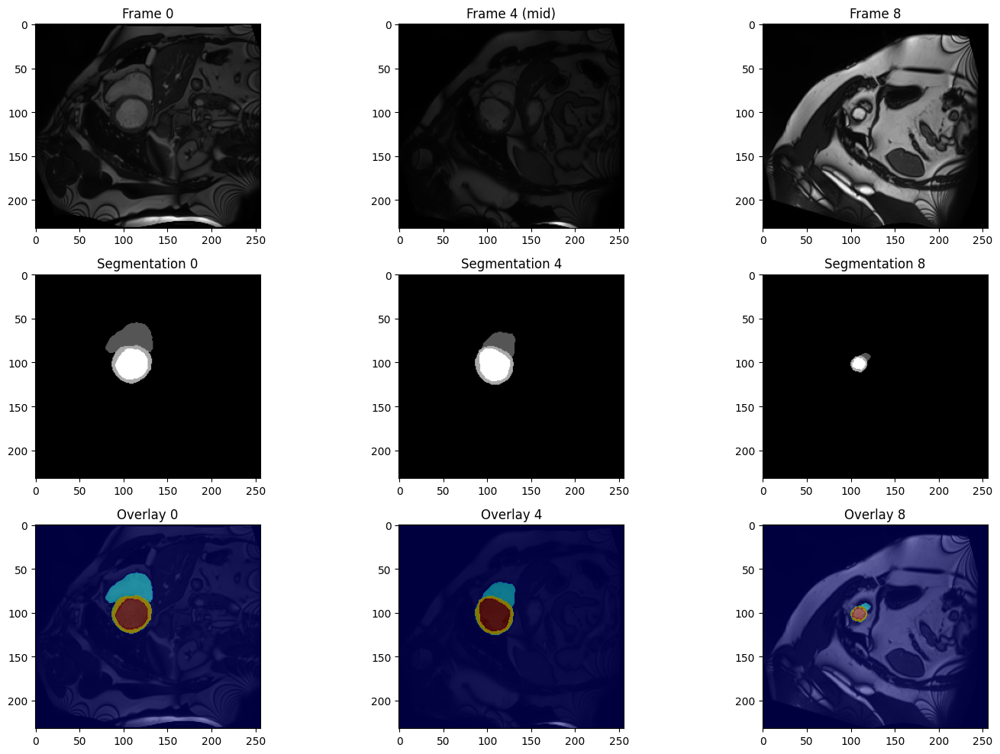

In [5]:
patient_id = 42
patient_images = load_patient_images(patient_id)

diastole, diastole_segmentation = patient_images["diastole"], patient_images["diastole_segmentation"]

x,y,z = diastole.shape

# Display the diastole phase image and segmentation
fig, axes = plt.subplots(3, 3, figsize=(15, 10))    
axes[0, 0].imshow(diastole[:, :, 0], cmap="gray")
axes[0, 0].set_title("Frame 0")
axes[0, 1].imshow(diastole[:, :, z//2], cmap="gray")
axes[0, 1].set_title(f"Frame {z//2} (mid)")
axes[0, 2].imshow(diastole[:, :, -1], cmap="gray")
axes[0, 2].set_title(f"Frame {z-1}")

axes[1, 0].imshow(diastole_segmentation[:, :, 0], cmap="gray")
axes[1, 0].set_title("Segmentation 0")
axes[1, 1].imshow(diastole_segmentation[:, :, z//2], cmap="gray")
axes[1, 1].set_title(f"Segmentation {z//2}")
axes[1, 2].imshow(diastole_segmentation[:, :, -1], cmap="gray")
axes[1, 2].set_title(f"Segmentation {z-1}")

axes[2, 0].imshow(diastole[:, :, 0], cmap="gray")
axes[2, 0].imshow(diastole_segmentation[:, :, 0], cmap="jet", alpha=0.5)
axes[2, 0].set_title("Overlay 0")
axes[2, 1].imshow(diastole[:, :, z//2], cmap="gray")
axes[2, 1].imshow(diastole_segmentation[:, :, z//2], cmap="jet", alpha=0.5)
axes[2, 1].set_title(f"Overlay {z//2}")
axes[2, 2].imshow(diastole[:, :, -1], cmap="gray")
axes[2, 2].imshow(diastole_segmentation[:, :, -1], cmap="jet", alpha=0.5)
axes[2, 2].set_title(f"Overlay {z-1}")

plt.tight_layout()
plt.show()

### Normalisation des images
Le patient 42 en est un bon exemple, mais l'analyse de la distribution des images montre que les intensités des pixels sont très variables. Il est donc nécessaire de normaliser les images pour les rendre comparables. Certaines images possédant des artefacts, on utilise une normalisation basé sur les percentiles.

In [6]:
def normalize(im, quantile_min=0.01, quantile_max=0.99):
    """
    Normalize the image based on quantile values.

    This normalizes the whole array, it is not layer-based.
    """
    min_value, max_value = np.quantile(im, [quantile_min, quantile_max])
    if abs(max_value - min_value) < 1e-5:
        print("Warning: image range is too small in normalize().")
        return np.zeros_like(im)
    im = (im - min_value) / (max_value - min_value)
    im = np.clip(im, 0, 1)
    return im

print("Function loaded successfully.")

Function loaded successfully.


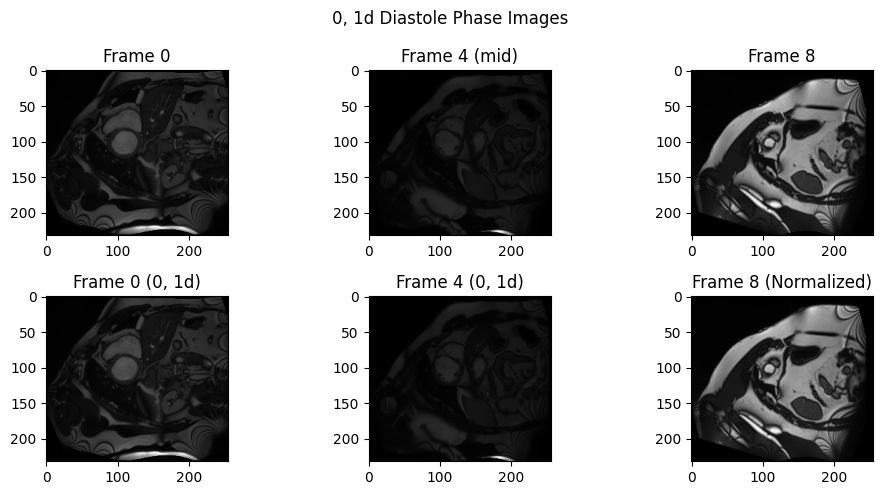

In [7]:
patient_id = 42
patient_images = load_patient_images(patient_id)

diastole = patient_images["diastole"]
z = diastole.shape[2]

fig, axes = plt.subplots(2, 3, figsize=(10, 5))

fig.suptitle("0, 1d Diastole Phase Images")

axes[0, 0].imshow(diastole[:, :, 0], cmap="gray")
axes[0, 0].set_title("Frame 0")
axes[0, 1].imshow(diastole[:, :, z//2], cmap="gray")
axes[0, 1].set_title(f"Frame {z//2} (mid)")
axes[0, 2].imshow(diastole[:, :, -1], cmap="gray")
axes[0, 2].set_title(f"Frame {z-1}")

axes[1, 0].imshow(diastole[:, :, 0], cmap="gray")
axes[1, 0].set_title("Frame 0 (0, 1d)")
axes[1, 1].imshow(diastole[:, :, z//2], cmap="gray")
axes[1, 1].set_title(f"Frame {z//2} (0, 1d)")
axes[1, 2].imshow(diastole[:, :, -1], cmap="gray")
axes[1, 2].set_title(f"Frame {z-1} (Normalized)")

plt.tight_layout()
plt.show()

## 3d visualization
Based on [Left ventricle using CNN](https://www.kaggle.com/code/abimbolasalawu/left-ventricle-using-cnn/notebook).

In [ ]:
patient_id = 4
patient_images = load_patient_images(patient_id)
image_4d = patient_images["image_4d"]

time_frame = 10 # Choose a time frame to visualize

volume = normalize(image_4d[:, :, :, time_frame])
volume = volume.T  # Transpose to match Plotly's axis order
slices, height, width = volume.shape

# Create frames for animation
fig = go.Figure(frames=[
    go.Frame(
        data=go.Surface(
            z=k * np.ones((height, width)),
            surfacecolor=volume[slices - 1 - k],
            cmin=volume.min(),
            cmax=volume.max(),
            colorscale='Gray',
            showscale=False,
        ),
        name=str(k)
    )
    for k in range(slices)
])

# Add the initial surface
fig.add_trace(go.Surface(
    z=(slices - 1) * np.ones((height, width)),
    surfacecolor=volume[slices - 1],
    colorscale='Gray',
    cmin=volume.min(),
    cmax=volume.max(),
    colorbar=dict(thickness=20, ticklen=4)
))

# Define animation settings
def frame_args(duration):
    return {
        "frame": {"duration": duration},
        "mode": "immediate",
        "fromcurrent": True,
        "transition": {"duration": duration, "easing": "linear"},
    }

# Configure sliders and buttons
sliders = [{
    "pad": {"b": 10, "t": 60},
    "len": 0.9,
    "x": 0.1,
    "y": 0,
    "steps": [
        {
            "args": [[f.name], frame_args(0)],
            "label": str(k),
            "method": "animate",
        }
        for k, f in enumerate(fig.frames)
    ],
}]

fig.update_layout(
    title='3D Visualization of MRI Slices (Constant Time Frame)',
    width=800,
    height=800,
    scene=dict(
        zaxis=dict(range=[-1, slices], autorange=False),
        aspectratio=dict(x=1, y=1, z=1),
        xaxis_title='Width',
        yaxis_title='Height',
        zaxis_title='Slices',
    ),
    updatemenus=[
        {
            "buttons": [
                {
                    "args": [None, frame_args(50)],
                    "label": "&#9654;",  # Play symbol
                    "method": "animate",
                },
                {
                    "args": [[None], frame_args(0)],
                    "label": "&#9724;",  # Pause symbol
                    "method": "animate",
                },
            ],
            "direction": "left",
            "pad": {"r": 10, "t": 70},
            "type": "buttons",
            "x": 0.1,
            "y": 0,
        }
    ],
    sliders=sliders
)

fig.show()

In [ ]:
patient_id = 42
patient_images = load_patient_images(patient_id)
image_4d = patient_images["image_4d"]

slice_frame = image_4d.shape[2] // 2 # Choose a slice to visualize

volume = normalize(image_4d[:, :, slice_frame, :])
volume = volume.T  # Transpose to match Plotly's axis order
slices, height, width = volume.shape

# Create frames for animation
fig = go.Figure(frames=[
    go.Frame(
        data=go.Surface(
            z=k * np.ones((height, width)),
            surfacecolor=volume[slices - 1 - k],
            cmin=volume.min(),
            cmax=volume.max(),
            colorscale='Gray',
            showscale=False,
        ),
        name=str(k)
    )
    for k in range(slices)
])

# Add the initial surface
fig.add_trace(go.Surface(
    z=(slices - 1) * np.ones((height, width)),
    surfacecolor=volume[slices - 1],
    colorscale='Gray',
    cmin=volume.min(),
    cmax=volume.max(),
    colorbar=dict(thickness=20, ticklen=4)
))

# Define animation settings
def frame_args(duration):
    return {
        "frame": {"duration": duration},
        "mode": "immediate",
        "fromcurrent": True,
        "transition": {"duration": duration, "easing": "linear"},
    }

# Configure sliders and buttons
sliders = [{
    "pad": {"b": 10, "t": 60},
    "len": 0.9,
    "x": 0.1,
    "y": 0,
    "steps": [
        {
            "args": [[f.name], frame_args(0)],
            "label": str(k),
            "method": "animate",
        }
        for k, f in enumerate(fig.frames)
    ],
}]

fig.update_layout(
    title='3D Visualization of MRI Slices (Constant Slice)',
    width=800,
    height=800,
    scene=dict(
        zaxis=dict(range=[-1, slices], autorange=False),
        aspectratio=dict(x=1, y=1, z=1),
        xaxis_title='Width',
        yaxis_title='Height',
        zaxis_title='Slices',
    ),
    updatemenus=[
        {
            "buttons": [
                {
                    "args": [None, frame_args(50)],
                    "label": "&#9654;",  # Play symbol
                    "method": "animate",
                },
                {
                    "args": [[None], frame_args(0)],
                    "label": "&#9724;",  # Pause symbol
                    "method": "animate",
                },
            ],
            "direction": "left",
            "pad": {"r": 10, "t": 70},
            "type": "buttons",
            "x": 0.1,
            "y": 0,
        }
    ],
    sliders=sliders
)

fig.show()

### Répartition des segmentations
On calcule la répartition de différentes données sur les segmentations fournies:
- Taille des segmentations
- Position des centres de masse des segmentations
- Rayon moyen des segmentations (assumé circulaire)

In [46]:
# All layers combined, diastole

radiuses, centers, areas = [], [], []

for i in tqdm(range(1, 101)):
    patient_images = load_patient_images(i)
    diastole_segmentation = patient_images["diastole_segmentation"]
    diastole_segmentation = diastole_segmentation == 3

    for layer in range(diastole_segmentation.shape[2]):
        layer_segmentation = diastole_segmentation[:, :, layer]
        area = np.sum(layer_segmentation)
        if area == 0:
            continue
        areas.append(area)
        center = np.array(np.where(layer_segmentation)).mean(axis=1)
        centers.append(center)
        
        radius = np.sqrt(area / np.pi)
        radiuses.append(radius)

percentile = 98

areas_percentile = np.percentile(areas, percentile)
radiuses_percentile = np.percentile(radiuses, percentile)

print("Statistics for all slices:")
print(f"Mean Area: {np.mean(areas):.2f}, Min Area: {np.min(areas):.2f}, Max Area: {np.max(areas):.2f}, {percentile}th percentile: {areas_percentile:2f}, Std Area: {np.std(areas):.2f}")
print(f"Mean Radius: {np.mean(radiuses):.2f}, Min Radius: {np.min(radiuses):.2f}, Max Radius: {np.max(radiuses):.2f}, {percentile}th percentile: {radiuses_percentile:2f}, Std Radius: {np.std(radiuses):.2f}")
print(f"Mean Center: ({np.mean(centers, axis=0)[0]:.2f}, {np.mean(centers, axis=0)[1]:.2f}), Std Center: ({np.std(centers, axis=0)[0]:.2f}, {np.std(centers, axis=0)[1]:.2f})")


100%|██████████| 100/100 [00:35<00:00,  2.83it/s]

Statistics for all slices:
Mean Area: 872.96, Min Area: 6.00, Max Area: 5359.00, 98th percentile: 2269.740000, Std Area: 566.43
Mean Radius: 15.77, Min Radius: 1.38, Max Radius: 41.30, 98th percentile: 26.878983, Std Radius: 5.39
Mean Center: (104.12, 120.28), Std Center: (19.78, 23.05)


### Fonctions de visualisation
On définit des fonctions *raccourcis* pour visualiser les images et les segmentations. Cela permet de débugger et visualiser plus facilement les algorithmes.

In [10]:
def show_image(im, title="", show=True):
    """
    Display an image using matplotlib.
    """
    if show:
        plt.imshow(im, cmap='gray')
        plt.title(title)
        plt.axis('off')
        plt.show()


def draw_seed(im, center, title=""):
    """
    Display an image with a seed point overlaid.
    """
    plt.figure()
    plt.imshow(im, cmap='gray')
    plt.scatter(*center, color='red')
    plt.title(title)
    plt.axis('off')
    plt.show()


def show_mask(im, mask):
    """
    Display an image with a mask overlaid.
    """
    plt.imshow(im, cmap='gray')
    plt.imshow(mask, cmap='jet', alpha=0.3)
    plt.axis('off')
    plt.show()


def show_mask_and_seed(im, center, mask, title=""):
    """
    Display an image with both a seed point and a mask overlaid.
    """
    plt.figure(figsize=(5, 5))
    plt.imshow(im, cmap='gray')
    plt.scatter(*center, color='red')
    plt.imshow(mask, cmap='jet', alpha=0.3)
    plt.title(title)
    plt.axis('off')
    plt.show()


---

## 2. Seed finding

Pout trouver la seed, il faut d'abord réussir à différencier le ventricule gauche du reste de l'image. Pour cela, nous avons fait plusieurs observations:
- Le ventricule gauche (LV) est la forme la plus ***circulaire*** de l'image.
- Le ventricule gauche (nottament ses parois) sont **l'une des régions les plus variables au fil du temps**. (voir la dernière image 3d)
- Le centre du ventricule gauche entre deux couches succésives est **proche**.

La première observation nous conduit à la recherche de cercles dans l'image. Pour cela, une **transformée de Hough** semble approprié.
La seconde observation nous encourage à utiliser un prétraitement utilisant la variabilité temporelle pour simplifier la recherche de cercles.

Nous avons alors essayé plusieurs approches: \
\
Pour le traitement avant Hough, nous avons essayé d'introduire les informations temporelles des manières suivantes:
  - Une différence entre systole et diastole (choix final, méthode rapide et tout aussi efficace)
  - Une analyse dans le domaine de Fourrier pour isoler les parties de l'image les plus variables (résultats initiaux similaires à la différence, nous n'avons pas creusé)
  - Un calcul pixel par pixel des variances au cours du temps

Au final, l'approche de différence entre systole et diastole a été retenue pour sa simplicité et son efficacité.

**Notre approche de seed finding est donc la suivante**:
- Calculer la différence entre systole et diastole
- Appliquer une fermeture puis une ouverture morphologique
- Appliquer une détection de contours, nottament pour binariser l'image
- Appliquer la transformée de Hough, garder le centre du premier cercle détecté

In [11]:
def computeDifference(image1, image2):
    """
    Compute the difference between two images.
    """
    return np.abs(image1 - image2)

def hough_transform(im, param1=50, param2=50, minradius=0, maxRadius=0):
    """
    Apply the Hough Circle Transform to detect circles in an image.

    Returns:
        numpy.ndarray: Detected circles.
    """
    im = np.uint8(im)
    hough = cv2.HoughCircles(im, cv2.HOUGH_GRADIENT, dp=1, minDist=1, param1=param1, param2=param2, minRadius=minradius, maxRadius=maxRadius)
    return hough


def seedFinder(diastole, systole, show=False):
    """
    Find the left ventricle (LV) center in the difference between diastole and systole images.

    Parameters:
    - diastole (numpy.ndarray): The diastole phase image. (2d)
    - systole (numpy.ndarray): The systole phase image. (2d)

    Returns:
        tuple: The (x, y) coordinates of the LV center.
    """
    diastole = normalize(diastole, 0.001, 0.999) * 255
    systole = normalize(systole, 0.001, 0.999) * 255

    diff = computeDifference(diastole, systole)
    diff = np.uint8(diff)

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    opened = cv2.morphologyEx(diff, cv2.MORPH_OPEN, kernel)

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
    closed = cv2.morphologyEx(opened, cv2.MORPH_CLOSE, kernel)

    normalized = normalize(closed, 0.001, 0.999) * 255
    normalized = np.uint8(normalized)

    edges = cv2.Canny(normalized, 500, 200)

    r_min = 8
    r_max = 15
    if diff.shape[1] > 400:
        r_min = 15
        r_max = 30

    circles = hough_transform(edges, param1=1, param2=1, minradius=r_min, maxRadius=r_max)
    if circles is not None:
        circles = circles[0]
        x, y, r = int(circles[0][0]), int(circles[0][1]), int(circles[0][2])
    else:
        x, y = diff.shape[1] // 2, diff.shape[0] // 2  # Default to image center if no circles found

    if show:
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        axes[0, 0].imshow(diff, cmap='gray')
        axes[0, 0].set_title("Difference")
        axes[0, 0].axis('off')

        axes[0, 1].imshow(opened, cmap='gray')
        axes[0, 1].set_title("After Opening")
        axes[0, 1].axis('off')

        axes[0, 2].imshow(closed, cmap='gray')
        axes[0, 2].set_title("After Closing")
        axes[0, 2].axis('off')

        axes[1, 0].imshow(normalized, cmap='gray')
        axes[1, 0].set_title("After Normalization")
        axes[1, 0].axis('off')

        diastole_circle = np.uint8(diastole)
        diff_display = cv2.circle(diff.copy(), (x, y), r, color=255)
        diff_display = cv2.circle(diff_display, (x, y), 3, color=255)
        axes[1, 1].imshow(diff_display, cmap='gray')
        axes[1, 1].set_title("Circle on Canny Edges")
        axes[1, 1].axis('off')

        diastole_circle = cv2.circle(diastole_circle.copy(), (x, y), r, color=255)
        diastole_circle = cv2.circle(diastole_circle, (x, y), 3, color=255)
        axes[1, 2].imshow(diastole_circle, cmap='gray')
        axes[1, 2].set_title("Circle on Diastole Image")
        axes[1, 2].axis('off')

        plt.tight_layout()
        plt.show()
    return (x, y)

print("Functions loaded successfully.")

Functions loaded successfully.


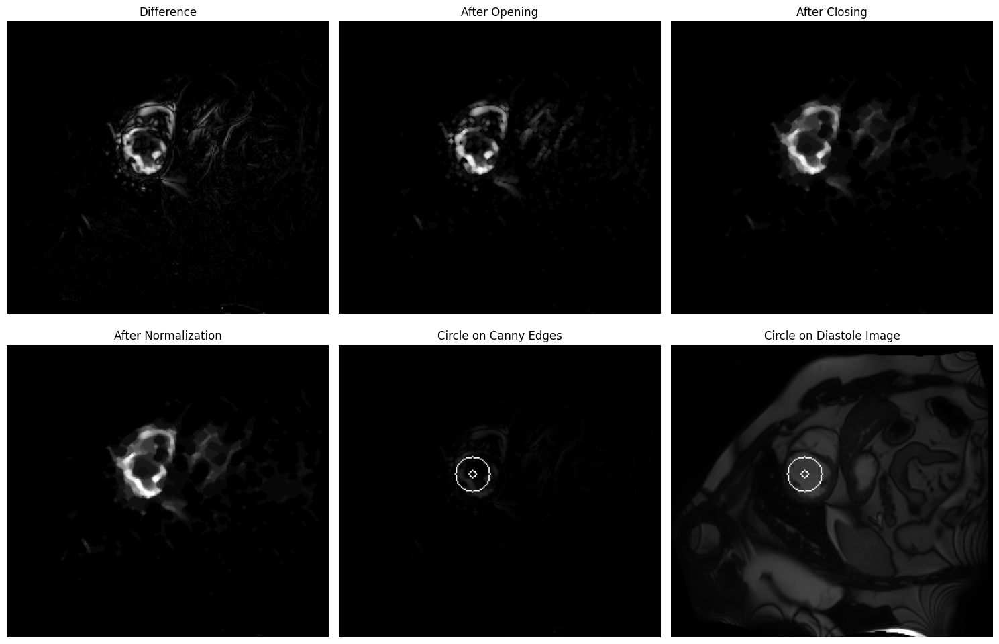

In [49]:
patient_id = 42
patient_images = load_patient_images(patient_id)
diastole = patient_images["diastole"]
systole = patient_images["systole"]
mid = diastole.shape[2] // 2
seed = seedFinder(diastole[:, :, mid], systole[:, :, mid], show=True)

Pour des raisons pratiques (on s'en servira plus tard), il peut être utile de trouver **les seeds pour toutes les couches d'un patient** (toutes les couches de la différence systole-diastole).

In [50]:
def seedFinderMultiple(i, show=False):
    """
    Find multiple the seed points for all slices of a patient.

    Parameters:
    - i (int): The patient ID.
    - show (bool): Whether to display the seed points.

    Returns:
        numpy.ndarray: Array of seed points.
    """
    seeds = []

    images = load_patient_images(i)
    diastoles = images["diastole"]
    systoles = images["systole"]
    z_max = diastoles.shape[2]

    for z in range(1, z_max):
        diastole = diastoles[:, :, z]
        systole = systoles[:, :, z]
        x, y = seedFinder(diastole, systole, show=show)
        seeds.append([x, y])

    seeds = np.array(seeds)
    if show:
        plt.imshow(diastoles[:, :, diastoles.shape[2] // 2], cmap='gray')
        plt.plot(seeds[:, 0], seeds[:, 1], 'ro')
        plt.axis('off')
        plt.show()

    return seeds

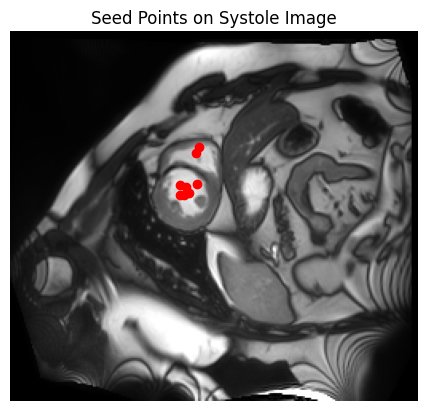

In [51]:
patient_id = 42
patient_images = load_patient_images(patient_id)
diastole = patient_images["diastole"]
systole = patient_images["systole"]
systole_seg = patient_images["systole_segmentation"]
diastole_seg = patient_images["diastole_segmentation"]
seeds = seedFinderMultiple(patient_id)

mid = diastole.shape[2] // 2

plt.imshow(normalize(systole[:, :, mid]), cmap='gray')
# plt.imshow(systole_seg[:, :, mid], cmap='jet', alpha=0.5)
plt.plot(seeds[:, 0], seeds[:, 1], 'ro')
plt.axis('off')
plt.title("Seed Points on Systole Image")
plt.show()



---

## 3. Region growing

Pour le region growing, nous avons décidé d'utiliser un **algorithme basé sur la tolérance par rapport au pixel de départ**. L'idée est alors d'augmenter la tolérance jusque à atteindre une condition donnée, si possible produisant une segmentation satisfaisante.

Pour fixer cette condition, notre remarque est que le ventricule gauche présente en général une frontière assez nette avec ses parois. **Une fois un certain seuil de tolérance atteint, on peut donc s'attendre à constater une augmentation rapide et soudaine de la taille de la région.**

La détéction de cette augmentation peut se traduire de plusieurs manières:
- Le dépassement d'un seuil fixé à l'avance (pas très robuste).
- Une augmentation rapide de la taille de la région (i.e. **dérivée élévée**).
- Le passage d'une région relativement *circulaire* à une forme moins régulière.

Après de nombreux essais, nous avons choisi de nous baser sur la seconde méthode. Nous avons donc implémenté un **algorithme de region growing** qui:
- Prend comme graine le point le plus lumineux dans le voisinage de la graine trouvée précédemment.
- Calcule les segmentations pour différentes valeurs de tolérance en partant d'une tolérance très faible (juste à atteindre une taille de segmentation bien trop grande).
- Retient une segmentation quelque étapes avant celle pour laquelle la dérivée de la taille de la région est maximale.

In [52]:
def growth(im, seed, tolerance=0.2):
    """
    Perform tolerance based region growing from a seed point.
    """
    I = im[seed[1], seed[0]]

    mask = flood(im, (seed[1], seed[0]), tolerance=I*tolerance)
    mask = convex_hull_image(mask)
    return mask
    
def incremental_growth(im, seed, tolerance=0.3, max_size_mask=1600, show=False):
    """
    Incrementally grow the region until a maximum size is reached.

    Parameters:
        im (numpy.ndarray): The input image.
        seed (tuple): The seed point (x, y).
        tolerance (float): Initial tolerance for region growing.
        max_size_mask (int): Maximum size of the mask to stop growing.

    Returns:
        numpy.ndarray: The grown region mask.
    """
    im = normalize(im, 0.001, 0.999) * 255
    im = np.uint8(im)
    seed = np.uint16(seed)

    w_size = 5
    window = im[seed[1]-w_size:seed[1]+w_size+1, seed[0]-w_size:seed[0]+w_size+1]
    window_seed = np.argmax(window)
    window_seed = np.unravel_index(window_seed, window.shape)
    window_seed = (int(seed[1]-w_size + window_seed[0]), int(seed[0]-w_size + window_seed[1]))
    seed = (window_seed[1], window_seed[0])

    mask = growth(im, seed, tolerance)
    while mask.sum() < max_size_mask:
        tolerance += 0.01
        mask = growth(im, seed, tolerance)
        if show:
            show_mask(im, mask)
    mask = growth(im, seed, tolerance-0.04)
    
    return mask

def find_explosion(sizes):
    """
    Parameters: 
        sizes (list): Une liste de tailles de masques
    Returns:
        int: The index of the explosion of mask size in the list sizes.
    """

    sizes = np.array(sizes)
    diff = np.diff(sizes)
    return np.argmax(diff)

def incremental_growth_derivative(images, seed, z, max_size_mask, minus, tolerance=0.1, show=False):
    """
    Incrementally grow the region until a maximum size is reached.
    We use the derivative of the mask size to detect the explosion point.

    Parameters:
        im (numpy.ndarray): The input image.
        seed (tuple): The seed point (x, y).
        tolerance (float): Initial tolerance for region growing.
        max_size_mask (int): Maximum size of the mask to stop growing.

    Returns:
        numpy.ndarray: The grown region mask.
    """
    im = images[:,:,z]
    im = normalize(im, 0.001, 0.999) * 255
    im = np.uint8(im)
    seed = np.uint16(seed)

    # We keep the local maximum in a 10x10 window around the seed
    w_size = 5
    window = im[seed[1]-w_size:seed[1]+w_size+1, seed[0]-w_size:seed[0]+w_size+1]
    window_seed = np.argmax(window)
    window_seed = np.unravel_index(window_seed, window.shape)
    window_seed = (int(seed[1]-w_size + window_seed[0]), int(seed[0]-w_size + window_seed[1]))
    seed = (window_seed[1], window_seed[0])

    sizes = []
    tolerances = []
    
    mask = growth(im, seed, tolerance)

    tolerances.append(tolerance)
    sizes.append(mask.sum())


    while mask.sum() < 3000:
        tolerance += 0.01
        
        mask = growth(im, seed, tolerance)
        z_normalized = round((z) / (images.shape[2]-1)*9)
        if mask.sum() < max_size_mask[z_normalized]:
            tolerances.append(tolerance)
            sizes.append(mask.sum())
        else:
            tolerances.append(tolerance)
            sizes.append(max_size_mask[z_normalized])


    sizes_end = sizes[len(sizes)//2:]
    differences = np.diff(sizes_end)
    if len(differences) == 0:
        return mask
    
    if len(sizes) >= 2:
        explosion_index = len(sizes)//2 + find_explosion(sizes[len(sizes)//2:])
    else:
        explosion_index = 0

    mask = growth(im, seed, tolerances[max(explosion_index-minus, 0)])

    
    if show:
        plt.figure(f"tailles des masques figures {z}")
        plt.plot(tolerances, sizes)
        plt.ylabel("mask size")
        plt.xlabel("tolerance")
        plt.scatter(tolerances[explosion_index], sizes[explosion_index], color="red")
        plt.title(f"slice {z}")
        plt.show()

    return mask


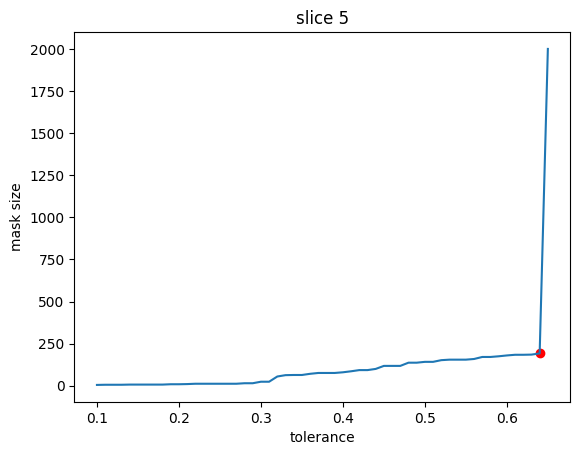

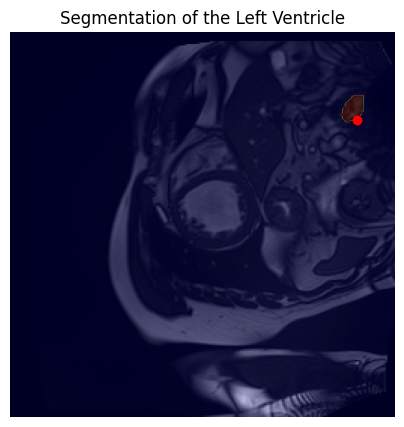

In [53]:
patient_id = 3
patient_images = load_patient_images(patient_id)
diastole = patient_images["diastole"]
systole = patient_images["systole"]
mid = diastole.shape[2] // 2
seed = seedFinder(diastole[:, :, mid], systole[:, :, mid], show=False)
mask = incremental_growth_derivative(diastole, seed, mid, max_size_mask=[2000]*10, minus=0, tolerance=0.1, show=True)
show_mask_and_seed(diastole[:, :, mid], seed, mask, title="Segmentation of the Left Ventricle")

Pour améliorer la robustesse de notre algorithme, nous avons ajouté la possibilité d'essayer différentes graines et de garder la meilleure. Ce choix de la meilleure segmentation est fait en fonction de la ***circulatité*** de la région segmentée.

In [54]:
def circularity(mask):
    """
    Compute a coefficient based on the circularity of a binary mask.
    """
    p = perimeter(mask)
    area = mask.sum()
    coeff = 4 * np.pi * area / p**2
    return coeff

def try_multiple_seeds(diastole, seeds, growth_function):
    """
    Try region growing from multiple seeds and select the best one.

    Parameters:
        diastole (numpy.ndarray): The diastole image.
        seeds (list): List of seed points.
        growth_function (function): The region growing function to use.

    Returns:
        tuple: The best mask and the corresponding seed point.
    """
    coeffs = []
    masks = []
    final_seeds = []
    
    for seed in seeds:
        mask = growth_function(diastole, seed)
        if mask.sum() > 200:
            coeff = circularity(mask)
            coeffs.append(coeff)
            final_seeds.append(seed)
            masks.append(mask)
    argmax_coeff = np.argmax(coeffs)
    best_mask = masks[argmax_coeff]
    best_seed = final_seeds[argmax_coeff]
    return best_mask, best_seed


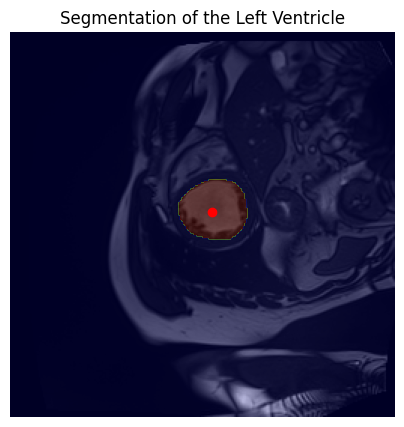

In [55]:
patient_id = 3
patient_images = load_patient_images(patient_id)
diastole = patient_images["diastole"]
systole = patient_images["systole"]
mid = diastole.shape[2] // 2
seeds = seedFinderMultiple(patient_id, show=False)
mask, seed = try_multiple_seeds(diastole[:, :, mid], seeds, incremental_growth)
show_mask_and_seed(diastole[:, :, mid], seed, mask, title="Segmentation of the Left Ventricle")

On code alors la fonction `several_seeds_growing` qui prend en entrée un patient, trouve une seed pour chaque couche de la diastole et de la systole et les essaie toutes pour trouver la meilleure segmentation de la couche centrale de la diastole ou de la systole.

Cela n'est pas très efficace, mais on profite de la proximité entre les graines des différentes couches pour améliorer la robustesse de notre algorithme.

In [56]:
def gravity_center(mask, *args):
    """
    Calculate the center of gravity of a binary mask.
    """
    mask_args = np.argwhere(mask)
    center_x = np.mean(mask_args[:,1])
    center_y = np.mean(mask_args[:,0])
    return np.array((center_x, center_y)).astype(np.uint16)

def energy(p, im_new, mask_prev, im_prev, window_size=11):
    w = window_size

    args = np.argwhere(mask_prev)
    im_prev_values = im_prev[tuple(args.T)]

    sigma_prev = np.std(im_prev_values)
    mean_prev = np.mean(im_prev_values)

    pCG = gravity_center(mask_prev)
    pCG = (int(pCG[0]), int(pCG[1]))
    
    Inew = im_new[*p]

    pCG = np.array(pCG)
    p = np.array(p)
    
    E1_square = ((2*sigma_prev)/(w-1))*np.linalg.norm(p-pCG)
    
    E2_square = (Inew - mean_prev)**2

    E = np.sqrt(E1_square + E2_square)
    
    
    return E

def lowest_energy_seed(mask_prev, im_new, im_prev, window_size=11):
    pCG = gravity_center(mask_prev)
   
    w = window_size
    min_energy = 1000000000000
    min_p = (0,0)
    
    for i in range(-(w//2), w//2+1):
        for j in range(-(w//2), w//2+1):
            
            p = np.array((i,j),dtype=np.int32) + np.array(pCG, dtype=np.int32)
            
            E = energy(p, im_new, mask_prev, im_prev, window_size)
            if E < min_energy:
                min_energy = E
                min_p = p
                
    return min_p

def several_seeds_growing(i, growth_function, image_type="diastole"):
    """
    Perform region growing using multiple seeds for a given patient.

    Parameters:
        i (int): The patient number.
        growth_function (function): The region growing function to use.

    Returns:
        tuple: The best mask and the corresponding seed point.
    """
    image_type = "diastole"

    seeds = seedFinderMultiple(i)
    diastole = load_frame(i, "mid", image_type=image_type)
    best_mask, best_seed = try_multiple_seeds(diastole, seeds, growth_function)
    gravity_seed = gravity_center(best_mask)
    best_mask = growth_function(diastole, gravity_seed)
    return best_mask, gravity_seed


---

## 4. Algorithme final

On choisit alors d'implémenter l'algorithme final de segmentation de la diastole (remplacer `diastole` par `systole` pour la systole):
1. On commence par calculer les seeds pour toutes les couches de la diastole et de la systole.
2. Pour l'ensemble de ses seeds, on performe l'algorithme de region growing (avec plusieurs seeds) sur la couche centrale de la diastole:
  - 2.1. Pour toutes les seeds de l'étape 1, on réalise un région growing (par taille), on garde la meilleure segmentation (selon la circularité).
  - 2.2. On calcule le centre de masse de la segmentation obtenue.
  - 2.3. On réalise un region growing (par dérivées) en prenant comme seed cette nouvelle graine: c'est notre segmentation finale de la couche centrale.
3. On calcule le centre de masse de cette nouvelle segmentation.
4. Pour chaque couche adjacente, on réalise un region growing (par dérivées) en prenant comme seed le centre de masse précédent.
5. On réitère les étapes 3 et 4 jusqu'à atteindre les extrémités de l'image.

In [68]:
def segment_diastole_or_systole(nb_person, propagation_growth_method, propagation_seed_method, image_type="diastole"):
    """
    Parameters:
        nb_person (int): The patient number.

    Returns:
        tuple: The masks and seeds for the patient.
    """
    if image_type == "diastole" or image_type == "systole":    
        images = load_patient_images(nb_person)[image_type]
    else:
        images = load_patient_images(nb_person)['image_4d'][:,:,:,image_type]
    

    
    nb_slices = images.shape[2]
    zmax = nb_slices - 1
    seeds = [None]*nb_slices
    masks = [None]*nb_slices
    zmid = nb_slices // 2

    mask, mid_seed = several_seeds_growing(nb_person, incremental_growth, image_type)

    mask = propagation_growth_method(images, mid_seed, zmid)

    seeds[zmid] = np.copy(mid_seed)
    masks[zmid] = np.copy(mask)

    mask = masks[zmid]
    for z in range(zmid+1, zmax+1):
        im_new = images[:,:,z]
        im_prev = images[:,:,z-1]
        gravity_seed = propagation_seed_method(mask, im_new, im_prev)
        seed = gravity_seed.astype(np.uint16)
        seeds[z] = np.copy(seed)
        mask = propagation_growth_method(images, seed, z)
        masks[z] = np.copy(mask)

    mask = masks[zmid]
    for z in range(zmid-1, -1, -1):
        im_new = images[:,:,z]
        im_prev = images[:,:,z+1]
        gravity_seed = propagation_seed_method(mask, im_new, im_prev)
        seed = gravity_seed.astype(np.uint16)
        seeds[z] = np.copy(seed)
        mask = propagation_growth_method(images, seed, z)
        masks[z] = np.copy(mask)

    return masks, seeds



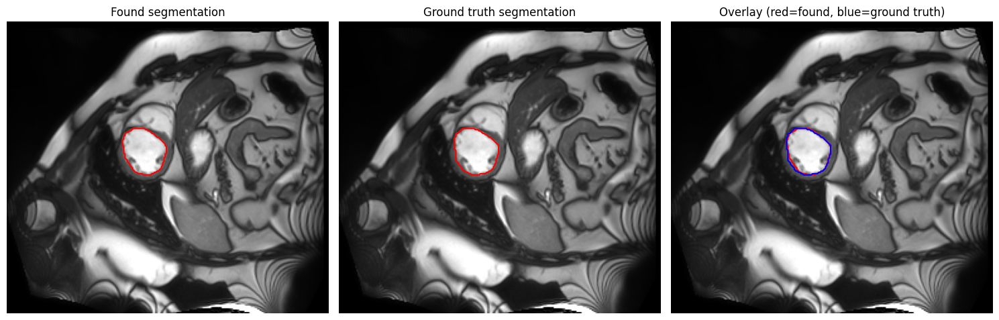

In [58]:
def propagation_growth(im, seed, z):
    max_sizes = [2000,2000,2000,2000,2000,2000,2000,2000,1000,1000]
    minus = 10
    return incremental_growth_derivative(im, seed, z, max_sizes, minus)

patient_id = 42
images = load_patient_images(patient_id)["diastole"]
images_gt = load_patient_images(patient_id)["diastole_segmentation"] == 3
segmented, seeds = segment_diastole_or_systole(patient_id, propagation_growth, gravity_center, image_type="diastole")

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(normalize(images[:, :, images.shape[2] // 2]), cmap='gray')
axes[0].contour(segmented[images.shape[2] // 2], colors='r', levels=[0.5])
axes[0].set_title("Found segmentation")
axes[0].axis('off')

axes[1].imshow(normalize(images[:, :, images_gt.shape[2] // 2]), cmap='gray')
axes[1].contour(images_gt[:, :, images_gt.shape[2] // 2], colors='r', levels=[0.5])
axes[1].set_title("Ground truth segmentation")
axes[1].axis('off')

axes[2].imshow(normalize(images[:, :, images.shape[2] // 2]), cmap='gray')
axes[2].contour(segmented[images.shape[2] // 2], colors='r', levels=[0.5])
axes[2].contour(images_gt[:, :, images_gt.shape[2] // 2], colors='b', levels=[0.5])
axes[2].set_title("Overlay (red=found, blue=ground truth)")
axes[2].axis('off')

plt.tight_layout()
plt.show()

---

## 5. Evaluation

Il ne reste plus qu'à évaluer notre algorithme. Pour cela, on utilise la métrique de Dice (ou de Jaccard) qui mesure la similarité entre deux ensembles. On calcule également le pourcentage de seeds placés dans le ventricule gauche (dans l'algorithme, une seed est le centre de gravité d'une région segmentée).

Pour mieux comprendre, nous avons également affiché les résultats par couches (on normalise à 10 couches, moyenne haute des images).

In [59]:
def is_in_left_ventricle(center: tuple, im_answer: np.array):
    """
    Check if the seed point is inside the ground truth LV region.
    """
    x, y = int(center[0]), int(center[1])

    if x >= im_answer.shape[1] or y >= im_answer.shape[0] or im_answer[y, x] != 3:
        return 0
    
    return 1

def jaccard_coefficient(mask, im_answer):
    """
    Calculate the Jaccard coefficient between the mask and ground truth.
    """
    intersection = ((im_answer == 3) & mask).sum()
    union = ((im_answer == 3) | mask).sum()
    jaccard = intersection / union if union != 0 else 0
    return jaccard

def dice_coefficient(mask, im_answer):
    """
    Cette fonction renvoie le coefficient de dice entre le mask et l'image réponse
    """
    intersection = (im_answer==3) & mask
    dice = 2 * intersection.sum() / ((im_answer==3).sum() + mask.sum())
    return dice

def whole_heart_dice_coefficient(masks, ims_answer):
    """
    Cette fonction renvoie le coefficient de dice entre le mask et l'image réponse
    """
    masks= np.array(masks)
    ims_answer = np.array(ims_answer)
    intersection = (ims_answer==3) & masks
    dice = 2 * intersection.sum() / ((ims_answer==3).sum() + masks.sum())
    return dice

In [60]:
def model_accuracy_all_slices(indexes, image_type, segmentation_algo, propagation_growth_method, propagation_seed_method, mask_acc_function, seed_acc_function, show=False):
    """
    Evaluate the model accuracy over a list of patient indexes.

    Returns:
        dict: Dictionary containing accuracy metrics.
    """
    dice_index_slices = [[] for _ in range(10)]
    seed_slices = [[] for _ in range(10)]
    dices_whole_heart = np.zeros(len(indexes))

    if show:
        plt.figure(2)
        fig, axs = plt.subplots(int(np.ceil(len(indexes) / 5)), 5, figsize=(25, 60))

    for i, patient_id in enumerate(tqdm(indexes)):

        masks, seeds = segmentation_algo(int(patient_id), propagation_growth_method, propagation_seed_method, image_type)
        masks = np.array(masks)
       
       
        ims = load_patient_images(int(patient_id))[image_type]
        ims_answer = load_patient_images(int(patient_id))[f"{image_type}_segmentation"]
        ims_answer = np.array(ims_answer)
        
        ims_answer_transposed = np.transpose(ims_answer, (2, 0, 1))
        

        
        

        dices_whole_heart[i] = whole_heart_dice_coefficient(masks, ims_answer_transposed)
        
        
        for z in range(ims_answer.shape[2]):
            
            im_answer = ims_answer[:, :, z]
            diastole = ims[:, :, z]
            mask = masks[z]
            seed = seeds[z]
            seed = (int(seed[0]), int(seed[1]))
            
            normalized_z = round((z / (ims_answer.shape[2]-1))*9)
            
            seed_acc = seed_acc_function(seed, im_answer)
            
            seed_slices[normalized_z].append(seed_acc)
            mask_acc = mask_acc_function(mask, im_answer)
            dice_index_slices[normalized_z].append(mask_acc)
        
            if show and z == ims_answer.shape[2] // 2:
                if len(indexes) > 5: fig_case = axs[i // 5, i % 5]
                else: fig_case = axs[i]
                fig_case.imshow(normalize(diastole), cmap='gray')
                fig_case.contour(im_answer == 3, colors='r', levels=[0.5])
                fig_case.contour(mask, colors='b', levels=[0.5])
                fig_case.set_title(f"Patient {patient_id}, Slice {z}")
                fig_case.axis('off')
    
    seed_acc_slices = [np.mean(row) * 100 if len(row) > 0 else 0 for row in seed_slices]
    mask_acc_slices = [np.mean(row) * 100 if len(row) > 0 else 0 for row in dice_index_slices]
    mask_std_slices = [np.std(row) * 100 if len(row) > 0 else 0 for row in dice_index_slices]
    layers = list(range(10))

    # Calculate the number of slices used for each layer
    slice_counts = [len(row) for row in dice_index_slices]
    
    # Update the DataFrame to include the slice counts
    df = pd.DataFrame({
        'Layer': layers,
        'Slices Used': slice_counts,
        'Seed in LV (%)': seed_acc_slices,
        'Dice Index (%)': mask_acc_slices,
        'Dice Std Dev (%)': mask_std_slices
    })
    
    seed_acc = np.mean([value for row in seed_slices for value in row]) * 100
    mask_acc = np.mean([value for row in dice_index_slices for value in row]) * 100
    mask_std = np.std([value for row in dice_index_slices for value in row]) * 100
    avg_dice_heart = np.mean(dices_whole_heart) * 100
    summary_df = pd.DataFrame({
        'Metric': ['Average Seed in LV (%)', 'Average Dice Index on slices (%)', 'Average Dice Std Dev (%)', 'Average Dice on whole Heart (%)'],
        'Value': [seed_acc, mask_acc, mask_std, avg_dice_heart]
    })
    
    print(f"Results for {image_type.capitalize()}: {'Diastole' if image_type == 'diastole' else 'Systole'}")
    print("\nPer Layer Metrics:")
    display(df)
    print("\nOverall Metrics:")
    display(summary_df)

    print("\nHistogram of Dice Index (all layers combined, not per image):")
    plt.hist([value for row in dice_index_slices for value in row], bins=20, color='skyblue', edgecolor='black')
    plt.xlabel("Dice Index")
    plt.ylabel("Frequency")
    plt.show()
    plt.show()

    return {
        "seed_accuracy_slices": seed_acc_slices,
        "mask_accuracy_slices": mask_acc_slices,
        "mask_dice_std_slices": mask_std_slices,
        "slice_counts": slice_counts,
        "seed_accuracy": seed_acc,
        "mask_accuracy": mask_acc,
        "mask_std": mask_std
    }

print("Function Loaded Succesfuly.")

Function Loaded Succesfuly.


**Voici la fonction d'évalutation finale, très modulable :**

Evaluating on training data on all slices


100%|██████████| 100/100 [10:25<00:00,  6.25s/it]

Results for Diastole: Diastole

Per Layer Metrics:


,Layer,Slices Used,Seed in LV (%),Dice Index (%),Dice Std Dev (%)
0,0,100,94.000000,90.093217,21.399909
1,1,94,100.000000,93.880481,10.538739
2,2,87,100.000000,96.206933,2.486279
3,3,101,100.000000,95.247651,7.414607
4,4,111,100.000000,95.225342,4.753552
5,5,76,98.684211,95.369936,3.688622
6,6,101,100.000000,95.284968,4.506343
7,7,76,100.000000,92.633754,10.542425
8,8,105,95.238095,90.464731,9.118334
9,9,100,74.000000,64.147935,34.180777



Overall Metrics:


,Metric,Value
0,Average Seed in LV (%),96.004206
1,Average Dice Index on slices (%),90.662217
2,Average Dice Std Dev (%),17.295824
3,Average Dice on whole Heart (%),93.181612



Histogram of Dice Index (all layers combined, not per image):


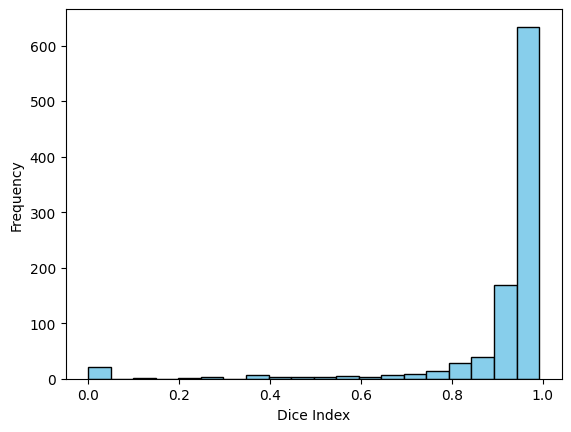

In [61]:
#Meilleur Modèle

def propagation_growth(im, seed, z):
    max_sizes = [2000,2000,2000,2000,2000,2000,2000,2000,1000,1000]
    minus = 10
    return incremental_growth_derivative(im, seed, z, max_sizes, minus)

print("Evaluating on training data on all slices")
results = model_accuracy_all_slices(indexes=range(1, 101, 1), 
                          image_type="diastole",
                          segmentation_algo=segment_diastole_or_systole,
                          propagation_growth_method=propagation_growth,
                          propagation_seed_method=gravity_center, 
                          mask_acc_function=dice_coefficient, 
                          seed_acc_function=is_in_left_ventricle, 
                          show=False)

print("")

Evaluating on training data on all slices


100%|██████████| 50/50 [05:22<00:00,  6.45s/it]

Results for Diastole: Diastole

Per Layer Metrics:


,Layer,Slices Used,Seed in LV (%),Dice Index (%),Dice Std Dev (%)
0,0,53,84.905660,78.455518,34.840991
1,1,57,98.245614,93.611470,13.131672
2,2,51,100.000000,96.215133,2.442858
3,3,55,98.181818,96.193322,2.460840
4,4,63,100.000000,95.963185,2.845469
5,5,42,100.000000,96.066921,3.026180
6,6,57,100.000000,95.980310,2.421816
7,7,49,100.000000,92.824964,10.352518
8,8,59,91.525424,85.913702,24.707176
9,9,52,59.615385,55.390072,41.531282



Overall Metrics:


,Metric,Value
0,Average Seed in LV (%),93.308550
1,Average Dice Index on slices (%),88.737147
2,Average Dice Std Dev (%),23.117186
3,Average Dice on whole Heart (%),92.277233



Histogram of Dice Index (all layers combined, not per image):


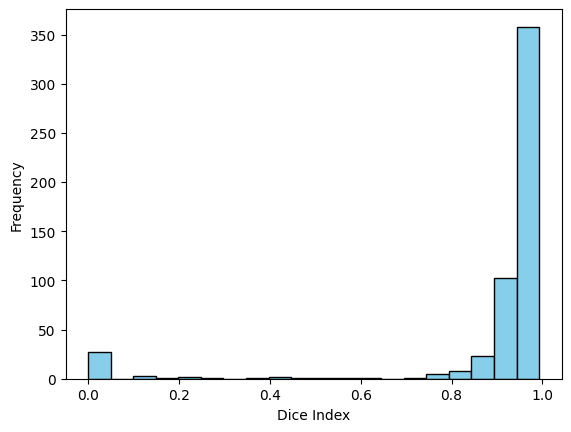

In [62]:
#Meilleur Modèle

def propagation_growth(im, seed, z):
    max_sizes = [2000,2000,2000,2000,2000,2000,2000,2000,1000,1000]
    minus = 10
    return incremental_growth_derivative(im, seed, z, max_sizes, minus)

print("Evaluating on training data on all slices")
results = model_accuracy_all_slices(indexes=range(101, 151, 1), 
                          image_type="diastole",
                          segmentation_algo=segment_diastole_or_systole,
                          propagation_growth_method=propagation_growth,
                          propagation_seed_method=gravity_center, 
                          mask_acc_function=dice_coefficient, 
                          seed_acc_function=is_in_left_ventricle, 
                          show=False)

print("")

Evaluating on training data on all slices


100%|██████████| 50/50 [04:29<00:00,  5.40s/it]

Results for Systole: Systole

Per Layer Metrics:


,Layer,Slices Used,Seed in LV (%),Dice Index (%),Dice Std Dev (%)
0,0,53,33.962264,31.116113,43.690526
1,1,57,80.701754,75.525379,35.046546
2,2,51,98.039216,89.889051,15.863978
3,3,55,96.363636,89.896227,13.981944
4,4,63,96.825397,86.529696,16.043739
5,5,42,100.000000,87.519395,10.713693
6,6,57,100.000000,84.124824,15.009096
7,7,49,95.918367,80.853800,20.549480
8,8,59,74.576271,59.298292,33.942632
9,9,52,25.000000,24.546477,34.247131



Overall Metrics:


,Metric,Value
0,Average Seed in LV (%),80.111524
1,Average Dice Index on slices (%),70.895701
2,Average Dice Std Dev (%),35.108131
3,Average Dice on whole Heart (%),73.839326



Histogram of Dice Index (all layers combined, not per image):


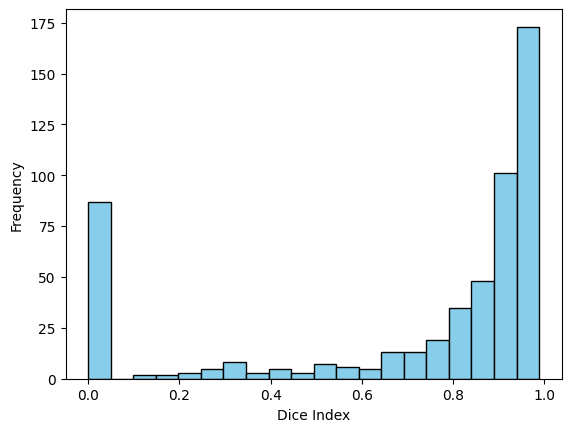

In [63]:
#Meilleur Modèle

def propagation_growth(im, seed, z):
    max_sizes = [2000,2000,2000,2000,2000,2000,2000,2000,1000,1000]
    minus = 10
    return incremental_growth_derivative(im, seed, z, max_sizes, minus)

print("Evaluating on training data on all slices")
results = model_accuracy_all_slices(indexes=range(101, 151, 1), 
                          image_type="systole",
                          segmentation_algo=segment_diastole_or_systole,
                          propagation_growth_method=propagation_growth,
                          propagation_seed_method=gravity_center, 
                          mask_acc_function=dice_coefficient, 
                          seed_acc_function=is_in_left_ventricle, 
                          show=False)
print("")

Evaluating on training data on all slices


100%|██████████| 100/100 [08:53<00:00,  5.34s/it]

Results for Systole: Systole

Per Layer Metrics:


,Layer,Slices Used,Seed in LV (%),Dice Index (%),Dice Std Dev (%)
0,0,100,74.000000,66.723182,40.449170
1,1,94,96.808511,89.073355,18.364561
2,2,87,100.000000,92.760144,5.728892
3,3,101,99.009901,89.104538,11.841459
4,4,111,98.198198,86.419369,15.333506
5,5,76,96.052632,85.572957,16.756457
6,6,101,96.039604,83.438227,18.412019
7,7,76,92.105263,80.388000,22.065830
8,8,105,76.190476,67.100983,32.747501
9,9,100,42.000000,33.513522,38.085178



Overall Metrics:


,Metric,Value
0,Average Seed in LV (%),86.540484
1,Average Dice Index on slices (%),76.913463
2,Average Dice Std Dev (%),30.232491
3,Average Dice on whole Heart (%),80.510456



Histogram of Dice Index (all layers combined, not per image):


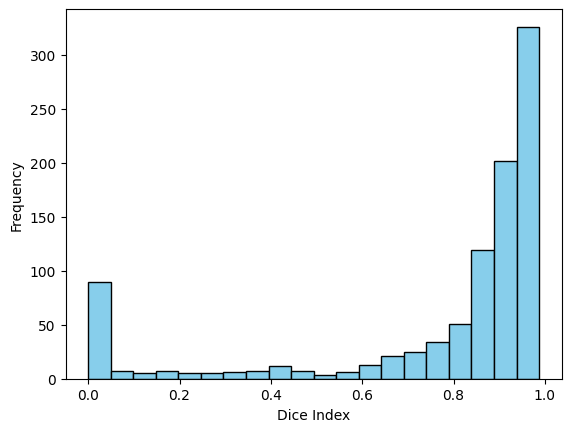

In [64]:
#Meilleur Modèle

def propagation_growth(im, seed, z):
    max_sizes = [2000,2000,2000,2000,2000,2000,2000,2000,1000,1000]
    minus = 10
    return incremental_growth_derivative(im, seed, z, max_sizes, minus)

print("Evaluating on training data on all slices")
results = model_accuracy_all_slices(indexes=range(1, 101, 1), 
                          image_type="systole",
                          segmentation_algo=segment_diastole_or_systole,
                          propagation_growth_method=propagation_growth,
                          propagation_seed_method=gravity_center, 
                          mask_acc_function=dice_coefficient, 
                          seed_acc_function=is_in_left_ventricle, 
                          show=False)
print("")

---

## 6. Conclusion

Avec un Dice moyen de **`0.88`** pour la diastole lorsque ce dice est calculé en 2D et de **`0.92`** lorsque ce dice est calculé en 3D (sur les données test), notre algorithme est plutot performant. Cependant, il reste encore des améliorations à apporter:
- **Gestion des bords**: les résultats de notre algorithmes sont bien moins bons sur les couches extrêmes. Il faudrait trouver une manière de gérer ces bords. En nous concentrant sur les couches centrales, notre dice moyen est plus élevé (environ **`0.95`**).
- **Systole**: lors de la construction de notre algorithme, nous nous sommes concentrés sur la diastole. Nous avons réalisé assez tardivement que la systole était plus difficile à segmenter. Avec plus de temps, nous aurions surement pu trouver un ensemble de paramètres plus adapté à la systole.

En conclusion, notre algorithme est performant, mais il reste des améliorations à apporter pour avoir des résultats proches de ceux obtenus dans le challenge original (basés sur des approches de Deep-Learning).

Afin de mettre en perspective nos résultats, nous avons également éssayé de créer un algorithme simple de depp-learning (**U-Net, resnet34 entrainé sur ImageNet, 5 epochs**, 90 secondes sur une v100 de l'école). En s'entrainant et évaluant uniquement sur la diastole, nous avons obtenus un Dice moyen de **`0.88`**. Notre algorithme est donc également performant, mais une approche de deep-learning un peu plus élaborée pourrait facilement le surpasser...

---

### Segmentations finales (diastole, couche centrale)

Evaluating on training data on all slices


100%|██████████| 50/50 [07:19<00:00,  8.78s/it]

Results for Diastole: Diastole

Per Layer Metrics:


,Layer,Slices Used,Seed in LV (%),Dice Index (%),Dice Std Dev (%)
0,0,53,84.905660,74.971246,33.354758
1,1,57,98.245614,89.336251,13.942383
2,2,51,100.000000,91.620790,5.895175
3,3,55,98.181818,90.509864,7.280649
4,4,63,100.000000,90.700151,6.346702
5,5,42,100.000000,91.712693,6.905941
6,6,57,100.000000,89.547611,9.893319
7,7,49,97.959184,82.800090,15.608331
8,8,59,89.830508,78.191317,25.141445
9,9,52,59.615385,46.557392,36.036844



Overall Metrics:


,Metric,Value
0,Average Seed in LV (%),92.936803
1,Average Dice Index on slices (%),82.673008
2,Average Dice Std Dev (%),23.374503
3,Average Dice on whole Heart (%),85.719827



Histogram of Dice Index (all layers combined, not per image):


<Figure size 640x480 with 0 Axes>

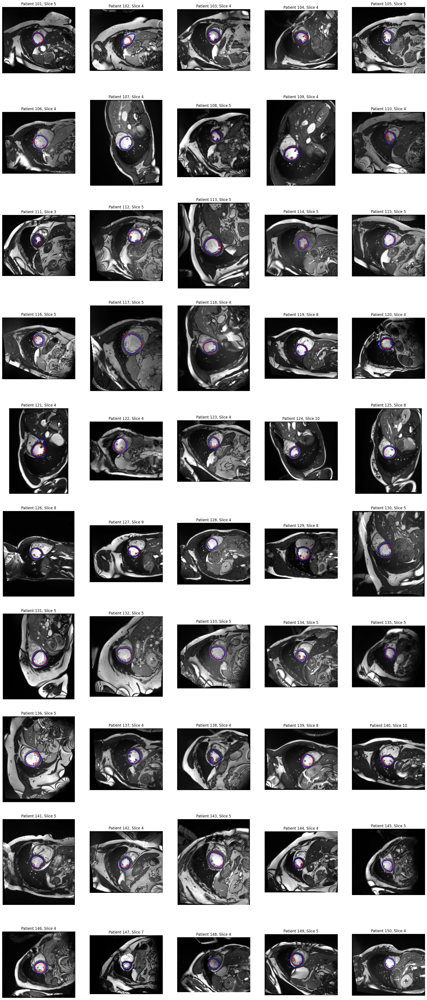

In [65]:
#Meilleur Modèle

def propagation_growth(im, seed, z):
    max_sizes = [2000,2000,2000,2000,2000,2000,2000,2000,1000,1000]
    minus = 0
    return incremental_growth_derivative(im, seed, z, max_sizes, minus)

print("Evaluating on training data on all slices")
results = model_accuracy_all_slices(indexes=range(101, 151, 1), 
                          image_type="diastole",
                          segmentation_algo=segment_diastole_or_systole,
                          propagation_growth_method=propagation_growth,
                          propagation_seed_method=gravity_center, 
                          mask_acc_function=dice_coefficient, 
                          seed_acc_function=is_in_left_ventricle, 
                          show=True)

print("")

Evaluating on training data on all slices


100%|██████████| 50/50 [06:47<00:00,  8.14s/it]

Results for Systole: Systole

Per Layer Metrics:


,Layer,Slices Used,Seed in LV (%),Dice Index (%),Dice Std Dev (%)
0,0,53,33.962264,31.116113,43.690526
1,1,57,80.701754,75.525379,35.046546
2,2,51,98.039216,89.889051,15.863978
3,3,55,96.363636,89.896227,13.981944
4,4,63,96.825397,86.529696,16.043739
5,5,42,100.000000,87.519395,10.713693
6,6,57,100.000000,84.124824,15.009096
7,7,49,95.918367,80.853800,20.549480
8,8,59,74.576271,59.298292,33.942632
9,9,52,25.000000,24.546477,34.247131



Overall Metrics:


,Metric,Value
0,Average Seed in LV (%),80.111524
1,Average Dice Index on slices (%),70.895701
2,Average Dice Std Dev (%),35.108131
3,Average Dice on whole Heart (%),73.839326



Histogram of Dice Index (all layers combined, not per image):


<Figure size 640x480 with 0 Axes>

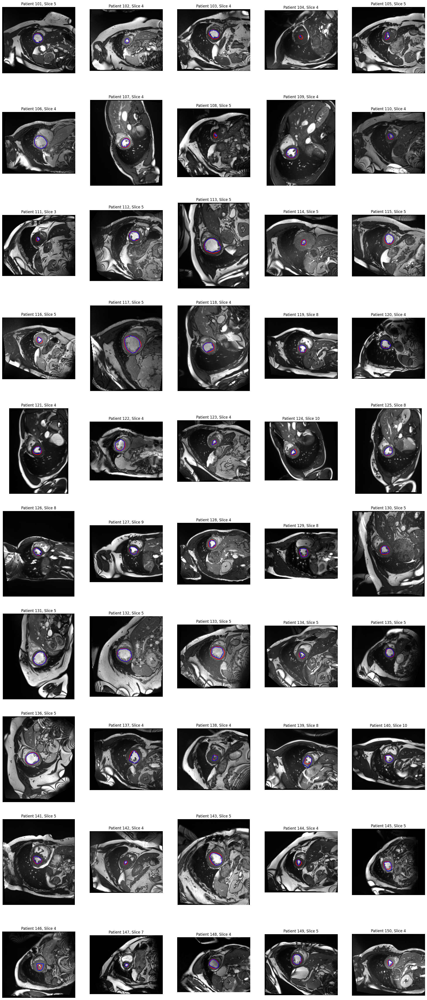

In [66]:
#Meilleur Modèle

def propagation_growth(im, seed, z):
    max_sizes = [2000,2000,2000,2000,2000,2000,2000,2000,1000,1000]
    minus = 10
    return incremental_growth_derivative(im, seed, z, max_sizes, minus)

print("Evaluating on training data on all slices")
results = model_accuracy_all_slices(indexes=range(101, 151, 1), 
                          image_type="systole",
                          segmentation_algo=segment_diastole_or_systole,
                          propagation_growth_method=propagation_growth,
                          propagation_seed_method=gravity_center, 
                          mask_acc_function=dice_coefficient, 
                          seed_acc_function=is_in_left_ventricle, 
                          show=True)

print("")

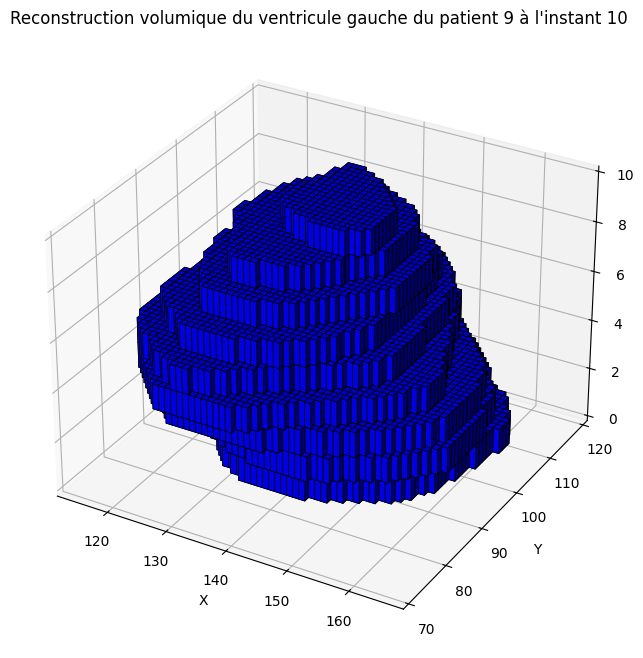

In [70]:
t=10


import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def propagation_growth(im, seed, z):
    max_sizes = [2000,2000,2000,2000,2000,2000,2000,2000,1000,1000]
    minus = 42
    return incremental_growth_derivative(im, seed, z, max_sizes, minus)
patient_id = 9
# Exemple : 5 couches de masques identiques

masks, _ = segment_diastole_or_systole(int(patient_id), propagation_growth, gravity_center, t)
masks = np.array(masks)

# Créer une grille 3D
x, y, z = np.indices((masks.shape[1] + 1, masks.shape[2] + 1, masks.shape[0] + 1))

# Générer les voxels basés sur les masques
voxels = masks.transpose(2, 1, 0)

# Visualiser les voxels
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')

# Afficher les voxels avec une couleur et des bords noirs
ax.voxels(voxels, facecolors="blue", edgecolors="black", linewidth=0.5)

# Ajuster les axes
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
ax.set_title(f"Reconstruction volumique du ventricule gauche du patient {patient_id} à l'instant {t}")

plt.show()
